In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import shutil
import cv2
import os
from tqdm import tqdm
%pip install ultralytics
import ultralytics
ultralytics.checks()
dataset_path="/kaggle/input/amlcw-splitdataset"

Ultralytics YOLOv8.2.14 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5597.6/8062.4 GB disk)


In [2]:
with open(f"{dataset_path}/ultralytics/data/mad.yaml", "r") as f:
    train_yaml=f.read()
with open(f"{dataset_path}/ultralytics/data/test.yaml", "r") as f:
    test_yaml=f.read()
    
train_yaml=train_yaml.replace("/kaggle/working", dataset_path)
test_yaml=test_yaml.replace("/kaggle/working", dataset_path)

with open(f"/kaggle/working/train.yaml","w") as f:
    f.write(train_yaml)
with open(f"/kaggle/working/test.yaml","w") as f:
    f.write(test_yaml)

In [3]:
from ultralytics import YOLO

model = YOLO('yolov8m.pt')
result=model.train(
    name='YOLOv8m_1',
    device=0,
    epochs=10,
    imgsz=640,
    batch=32,
    data=f'/kaggle/working/train.yaml',
)

100%|██████████| 49.7M/49.7M [00:00<00:00, 300MB/s]


Ultralytics YOLOv8.2.14 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/kaggle/working/train.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=YOLOv8m_1, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True

100%|██████████| 755k/755k [00:00<00:00, 36.4MB/s]
2024-05-13 17:08:55,773	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-05-13 17:08:56,560	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-05-13 17:08:58.845273: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-13 17:08:58.845369: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-13 17:08:58.972774: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS facto

Overriding model.yaml nc=80 with nc=49

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytic

100%|██████████| 6.23M/6.23M [00:00<00:00, 168MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/amlcw-splitdataset/ultralytics/data/train/labels... 11896 images, 0 backgrounds, 45 corrupt: 100%|██████████| 11941/11941 [00:44<00:00, 270.61it/s]

train: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/08b11baa46e2d9185dd9ee4af5ce89fc.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/08b11baa46e2d9185dd9ee4af5ce89fc.jpg'
train: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/1e8b43deca87d25180aba67557735c01.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/1e8b43deca87d25180aba67557735c01.jpg'
train: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/2044a7ebe3d8132a8bce492f42bbde1d.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/2044a7ebe3d8132a8bce492f42bbde1d.jpg'
train: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/train/images/2790a93ba1210aaaa09931b951d2376a.jpg: ignoring corrupt image/lab

train: WARNING ⚠️ Cache directory /kaggle/input/amlcw-splitdataset/ultralytics/data/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/amlcw-splitdataset/ultralytics/data/valid/labels... 2115 images, 0 backgrounds, 10 corrupt: 100%|██████████| 2125/2125 [00:09<00:00, 232.69it/s]


val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/44a429b8b5a6165e21405347ed412649.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/44a429b8b5a6165e21405347ed412649.jpg'
val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/548f7e5aead26331a842402c2a2e1abf.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/548f7e5aead26331a842402c2a2e1abf.jpg'
val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/5ed8dd35ea5346ac1dc70a726411cd04.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/5ed8dd35ea5346ac1dc70a726411cd04.jpg'
val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/valid/images/87825161a8c72af4e78e0a18be245e34.jpg: ignoring corrupt image/label: [Err

       1/10      15.3G     0.7043      4.181      1.078         37        640: 100%|██████████| 372/372 [07:31<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [01:02<00:00,  1.85s/it]


                   all       2115       2355      0.177      0.192     0.0465     0.0389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      15.2G     0.7104      2.833      1.063         40        640: 100%|██████████| 372/372 [07:20<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [01:01<00:00,  1.81s/it]


                   all       2115       2355       0.22       0.22     0.0899     0.0754

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      15.2G     0.7045      2.475      1.054         32        640: 100%|██████████| 372/372 [07:20<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:58<00:00,  1.72s/it]


                   all       2115       2355      0.305      0.216      0.143      0.119

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      15.2G     0.6974      2.256      1.047         28        640: 100%|██████████| 372/372 [07:19<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [01:01<00:00,  1.81s/it]


                   all       2115       2355      0.229      0.304      0.176       0.15

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      15.2G     0.6472      2.007      1.019         31        640: 100%|██████████| 372/372 [07:24<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:57<00:00,  1.69s/it]


                   all       2115       2355      0.228      0.379      0.224      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      15.2G     0.5945      1.772     0.9858         36        640: 100%|██████████| 372/372 [07:23<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:58<00:00,  1.71s/it]


                   all       2115       2355      0.305      0.402      0.285      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      15.2G      0.554      1.568     0.9641         47        640: 100%|██████████| 372/372 [07:27<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:57<00:00,  1.68s/it]


                   all       2115       2355      0.315      0.428      0.299      0.265

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      15.2G     0.5197      1.367     0.9472         42        640: 100%|██████████| 372/372 [07:21<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [01:01<00:00,  1.80s/it]


                   all       2115       2355      0.367      0.488      0.341      0.307

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      15.2G     0.4854      1.205     0.9304         34        640: 100%|██████████| 372/372 [07:20<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:56<00:00,  1.66s/it]


                   all       2115       2355      0.369      0.537      0.373      0.337

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      15.2G     0.4592      1.049     0.9137         33        640: 100%|██████████| 372/372 [07:19<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:57<00:00,  1.69s/it]


                   all       2115       2355      0.385      0.573      0.381      0.345

10 epochs completed in 1.407 hours.
Optimizer stripped from runs/detect/YOLOv8m_1/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/YOLOv8m_1/weights/best.pt, 52.0MB

Validating runs/detect/YOLOv8m_1/weights/best.pt...
Ultralytics YOLOv8.2.14 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 218 layers, 25868131 parameters, 0 gradients, 78.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [01:00<00:00,  1.79s/it]


                   all       2115       2355      0.386      0.571      0.381      0.345
                   A10       2115         60      0.328      0.717      0.306      0.264
                 A400M       2115         41      0.401      0.736      0.469      0.396
                 AG600       2115         22      0.715      0.797      0.738       0.66
                  AV8B       2115         36      0.303      0.639      0.359      0.342
                    B1       2115         58      0.372      0.714      0.344      0.302
                    B2       2115         47      0.458       0.66      0.452      0.398
                   B52       2115         51       0.29      0.784      0.277       0.25
                 Be200       2115         26      0.607      0.772      0.766      0.723
                  C130       2115         99      0.289      0.574      0.263      0.208
                   C17       2115         56      0.283       0.64      0.328      0.302
                    C

In [4]:
!yolo val \
model='/kaggle/input/amlcw/runs/detect/YOLOv8m_1/weights/best.pt' \
data='/kaggle/working/test.yaml'\
batch=4 \
device=cuda:0 \
imgsz=640

Ultralytics YOLOv8.2.14 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 218 layers, 25868131 parameters, 0 gradients, 78.8 GFLOPs
val: Scanning /kaggle/input/amlcw-splitdataset/ultralytics/data/test/labels... 2
val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/test/images/014240b10dffa805240c72655e357866.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/test/images/014240b10dffa805240c72655e357866.jpg'
val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/test/images/0659b84f8272d49753431dc808b8d4e1.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/amlcw-splitdataset/ultralytics/data/test/images/0659b84f8272d49753431dc808b8d4e1.jpg'
val: WARNING ⚠️ /kaggle/input/amlcw-splitdataset/ultralytics/data/test/images/14dd66103e6399d3754f6bcb53fdead2.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/k

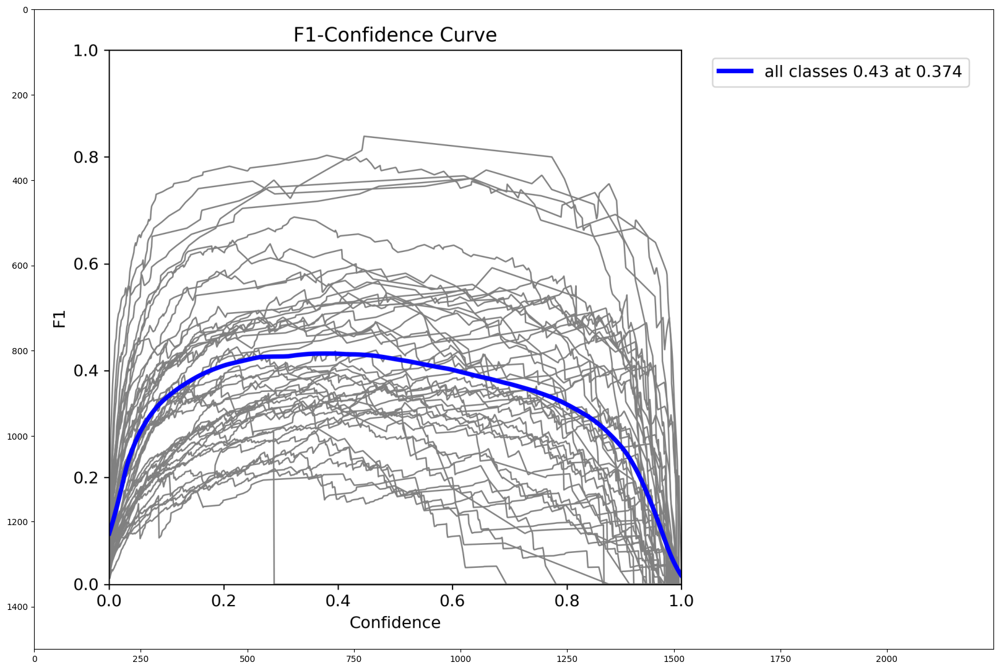

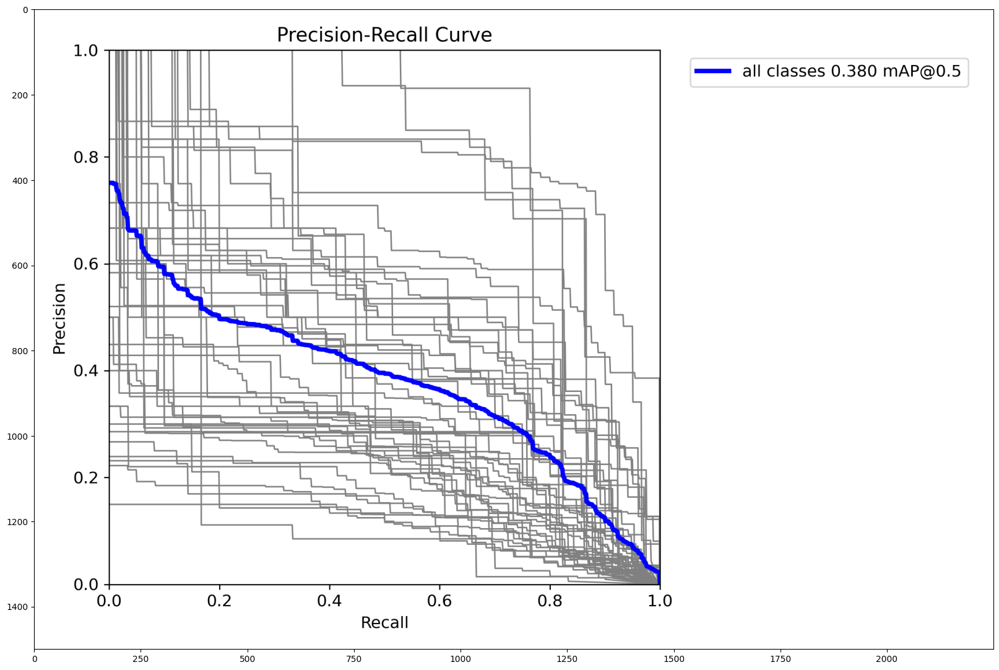

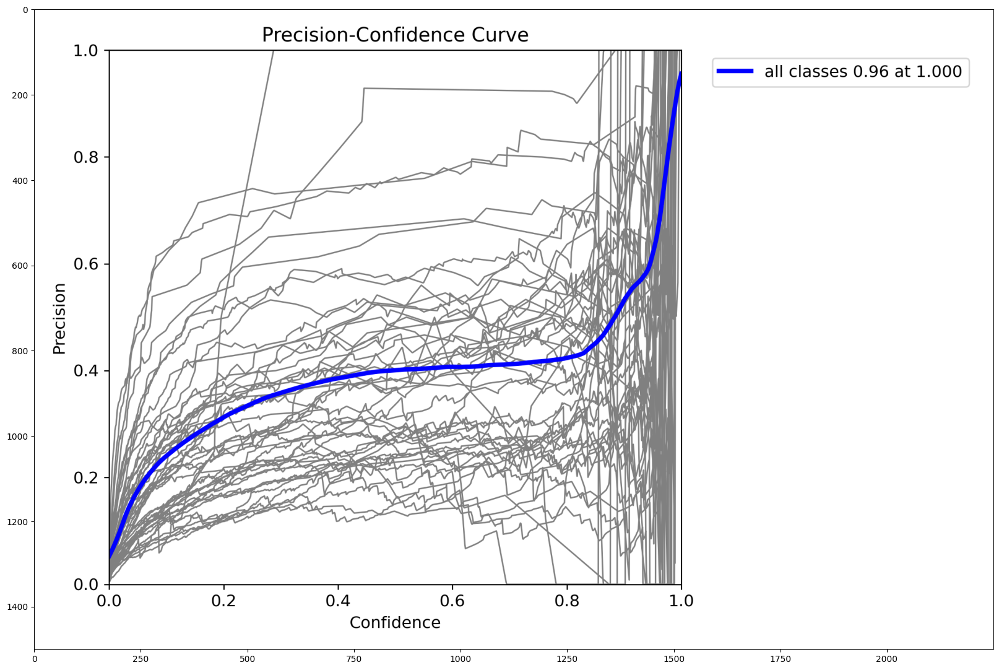

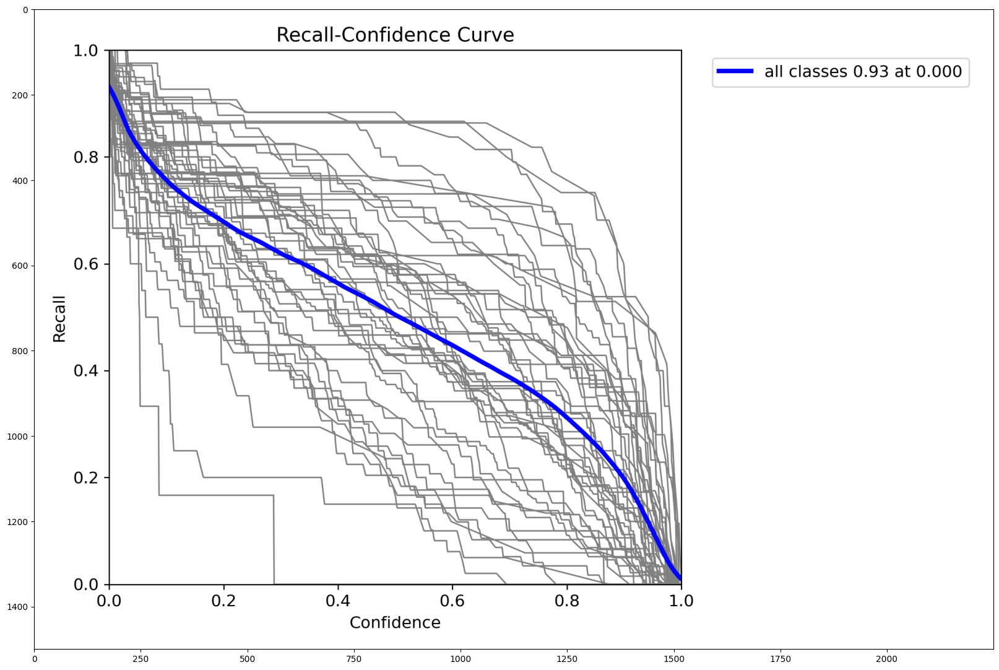

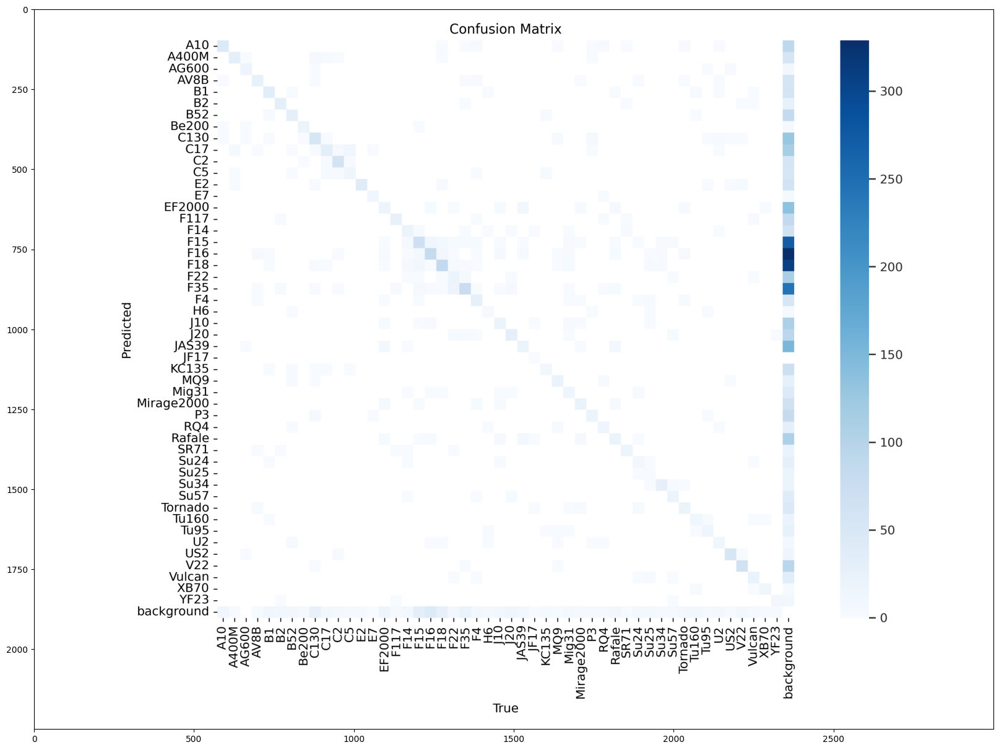

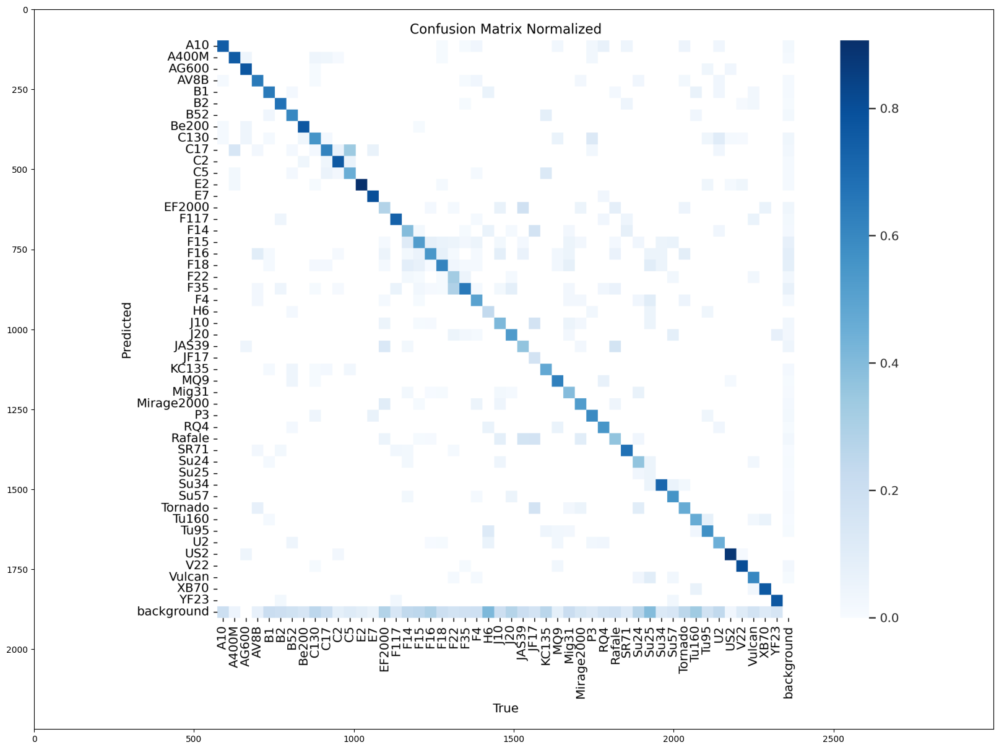

In [5]:
for path in sorted(glob.glob('/kaggle/working/runs/detect/val/*.png')):
    image = cv2.imread(path)[:,:,::-1]
    plt.figure(figsize=(20,20))
    plt.imshow(image)
    plt.show()

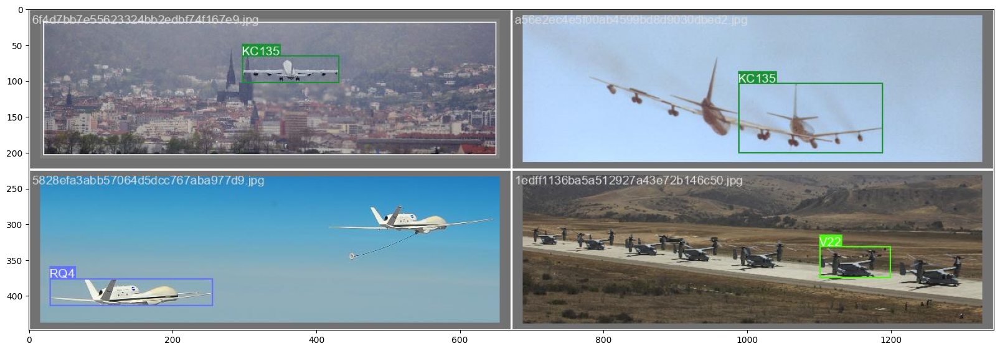

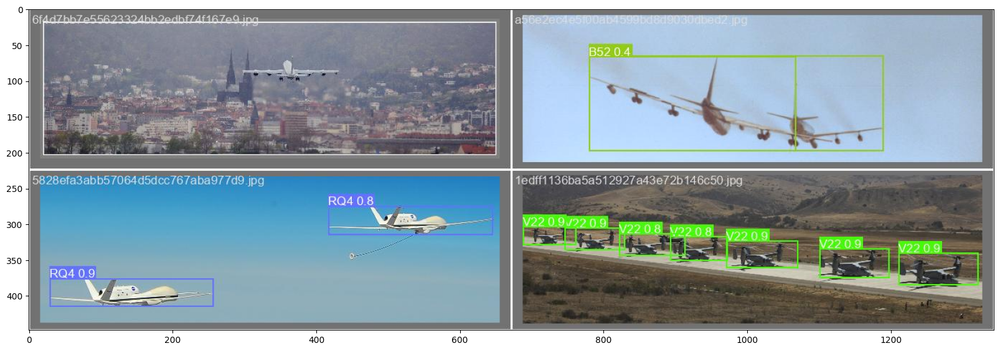

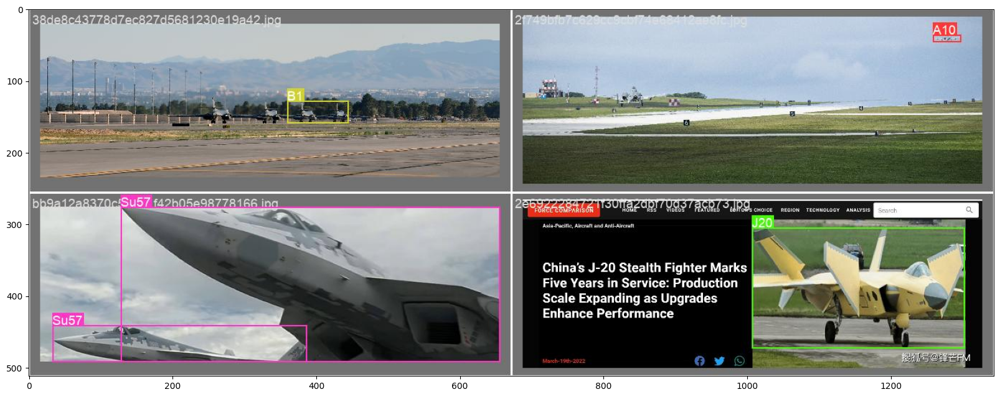

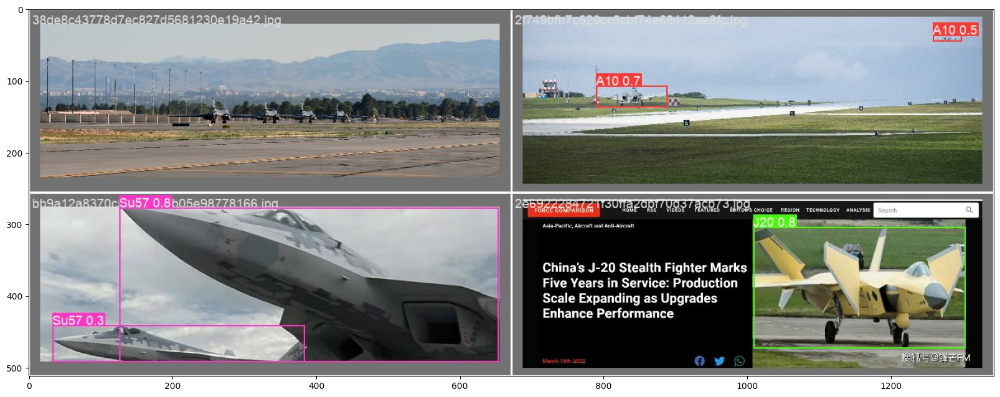

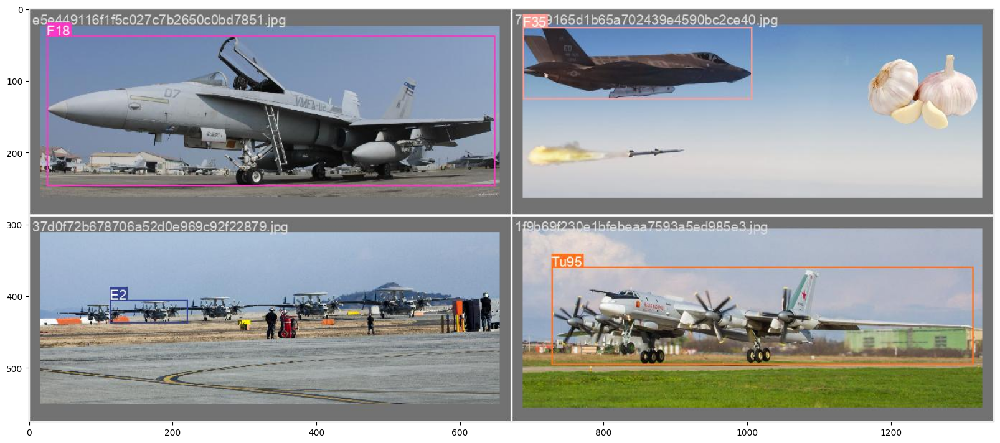

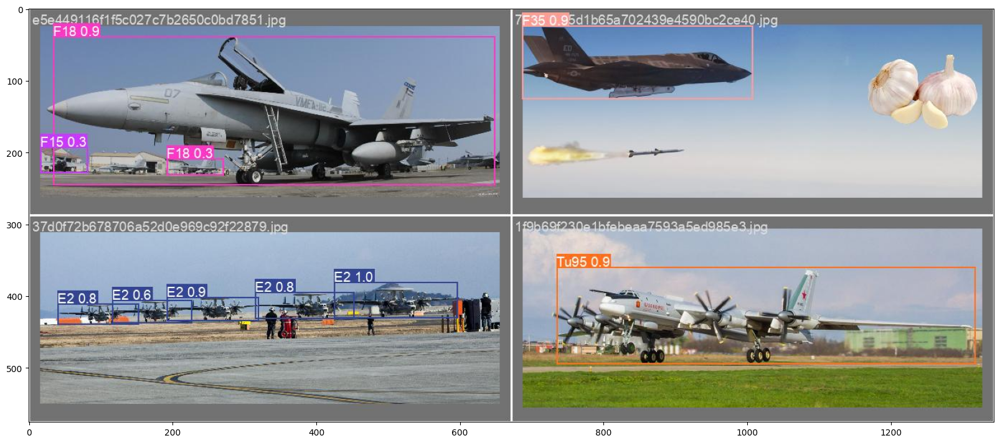

In [6]:
for path in sorted(glob.glob('/kaggle/working/runs/detect/val/*.jpg')):
    image = cv2.imread(path)[:,:,::-1]
    plt.figure(figsize=(20,20))
    plt.imshow(image)
    plt.show()